# Neural Networks for Data Science Applications (2019/2020)
## Final exam 

* **Student**: Egon Ferri (1700963).
* **Reference paper / topic**: Jacek Komorowski, Grzegorz Kurzejamski, Grzegorz Sarwas, 2019.

    DeepBall: Deep Neural-Network Ball Detector and FootAndBall: Integrated player and ball detector.

## Part 1: Report


### Summary

The paper describes the implementation of a neural network with the scope to dectet ball in long shot HD videos of football matches.
The network is fully convolutional, and produces confindence maps that encode the position of the detected ball.
A part from the confidence map, the main "new" technical feature is represented by the use of the hypercolumn concept;
feature maps at different deep level are upsampled to match dimensions, joined and fed all together to the last convolutional layer.

The idea is to keep the network simple and a relatively low number of parameters, in order to be able to process video very fast.

### The network

#### Architecture

As said, the network is a full convolutional network:

![](arch.jpg)

Each convolutional layer is followed by Batch normalization and ReLU non-linearity. All convolutions use same padding and stride one except the first one that uses stride two.

![](arch2.jpg)

<div style="text-align: right"> Images taken from the cited paper </div>

#### Loss function

I used the loss function of the second paper, that is based on a one-channel confidence map (instead of the ball map/ background map of the first paper).
The pseudo cross-entropy loss is this:

$$ \cal L_{B}=-\sum_{(i, j) \in P o s^{B}} \log c_{ij}^{B}-\sum_{(i, j) \in N e g^{B}} \log \left(1-c_{i j}^{B}\right)$$

Where $c_{ij}^B$ is the value of the confidence map at spatial location $(i, j)$.

$Pos^B$ and $Neg^B$ are the sets of positive and negative examples.
As positive examples are taken 9 pixels: the labeled ball position and all the nearest pixel.
As negative examples are taken the 27 pixel with highest confindence loss (excluding all the pixel of the positive example).

#### Accuracy

In our scenario only one or zero balls are present in each image.
Given this constraint, the accuracy is defined as follows: for each image the detector returns the
highest value position from the ball confidence map.
If this value is smaller than the threshold $\theta$, the prediction is that we have no balls in the image.
If this value is greater than $\theta$, the ball is detected in that point.

In this framework, an image with the ball is classified correctly if the ball is detected at
the label location or in its nearest neigborhood. An image without the ball is
classified correctly, if ball is not detected. 

$\theta$ is chosen empirically, as the value maximizing the accuracy on the validation set.


#### My re-implementation 

Reimplementing the paper, I had to face three main issues:

_Damaged data_

The original work uses 6 videos with annotations (different static cameras, same match).
I got them with wrong annotation. I could only succeed in fixing cameras 1,3,4,5.
So, while the original paper uses camera 1,2,3,4 for training and 5 and 6 for test, I decided to use camera 1,3 and 4 for the train, leaving camera 5 for the test.

_Worse GPU_

My GPU, altough not bad, it's not as powerful as the GPU used by paper's authors.
This forced me to reduce batch size from 16 to 4, with a substancial decrese of speed, so I performed my experiments on a smaller number of epochs.

The performance, however, did not get a lot worse, since each epoch, given the fact that the data is splitted in smaller batch, has a lot of steps more.

_Vague Hyperparameters_

A lot oh Hyperparameters were not specified in the article.
So I had to choose myself the specific setting for the data augumentation, and the final threshold $\theta$.

## Part 2: External libraries

In [1]:
import matplotlib.pyplot as plt
import random 
from sklearn.model_selection import train_test_split
import pickle 
import tensorflow as tf
from tensorflow.keras import Model, layers
import numpy as np 

AUTOTUNE = tf.data.experimental.AUTOTUNE #to parallelize the data augmentation

import glob #useful working with paths
import cv2 #useful working with video and images


from utilities import * #utilities contains the functions not strictly related
                        #to the architecture, like data managing and plots, stored here for tidyness

## Part 3: Code

Due to the heavyness of the datset, only a toy example is given to try the code.

You will not be able to run the training of the net, but the best weight obtained training the last models are also given to visualize results on the toy subset at the end. 

In [21]:
toy=get_data(cams=[5], val_split=False)

The function get_data gives as output a tensorflow dataset object. It allows to choose the camera, to choose if take a test that contains only image with the ball (or only image without the ball), a validation split and a reduction to get smaller dataset.

### Image preprocessing

Functions to transform the [x,y] label into 268x480 confidence map.

In [4]:
def no_ball():
    ball_map=tf.zeros((268,480))
    return ball_map
def ball(x,y):
    ball_map=tf.zeros((268,480))
    #tensors does not support 2d indices, so "slices"==rows are created and inserted at the right position
    indices =([[y-1],[y+1],[y]]) 
    rep= tf.concat([tf.zeros(x-1), tf.ones(3),tf.zeros(478-x)], -1)
    updates = [rep,rep,rep]
    ball_map= tf.tensor_scatter_nd_update(ball_map, indices, updates)
    return ball_map

Since both the images (HD 1920x1080 frames) and the labels (268x480 confidence maps) are heavy objects that wouldn't fit in our GPU at the same time, we need to preprocess them each time a batch is loaded.

In [5]:
def preprocess(path, label):
  
    image = tf.io.read_file(path)
    image = tf.io.decode_image(image, channels=3) 
    image = tf.image.resize_with_crop_or_pad(image, 1080, 1920) 
    image = tf.cast(image, tf.float32) / 255.0
    label=tf.cond(label[0]==tf.constant([0]), lambda: no_ball() , lambda:ball(label[0],label[1]))  
 
    return image, label

### Data augmentation

To increase the variety of the dataset and mitigate the risk of overfitting, data augmentation on the fly is applied.
The manipulation applied on the images are:

    Random brightness
    Random contrst
    Random saturation
    Random hue
    Random left-right filp
    Random crop

In [6]:
def augmenter(image, label):
    image = tf.image.random_brightness(image, 0.15)
    image = tf.image.random_contrast(image, upper=1.5, lower=0.5)
    image = tf.image.random_saturation(image,upper=1.5, lower=0.5)
    image = tf.image.random_hue(image, 0.15)
    if tf.random.uniform([])>0.5:
        image= tf.image.flip_left_right(image)
        label= tf.image.flip_left_right(tf.expand_dims(label, axis=-1))
        label= tf.squeeze(label, axis=-1)
    if tf.random.uniform([])>0.75:
        a= tf.random.uniform([],minval=0, maxval=67, dtype=tf.int32)
        b= tf.random.uniform([],minval=0, maxval=120, dtype=tf.int32)
        c= tf.random.uniform([],minval=a+134, maxval=268, dtype=tf.int32)-a
        d= tf.random.uniform([],minval=b+240, maxval=480, dtype=tf.int32)-b
        image=tf.image.crop_to_bounding_box(image, a*4,b*4, c*4, d*4)
        image=tf.image.pad_to_bounding_box(image,a*4, b*4, 1080, 1920)
        label=tf.expand_dims(label, axis=-1)
        label=tf.image.crop_to_bounding_box(label, a,b,c,d)
        label=tf.image.pad_to_bounding_box(label,a,b, 268, 480)
        label=tf.squeeze(label, axis=-1)
    return image, label

A glance to see that everything is working well:

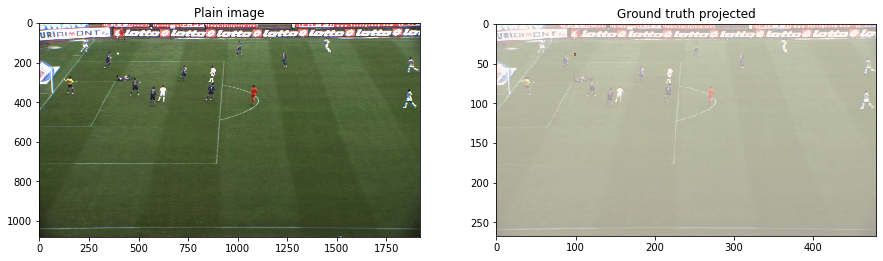

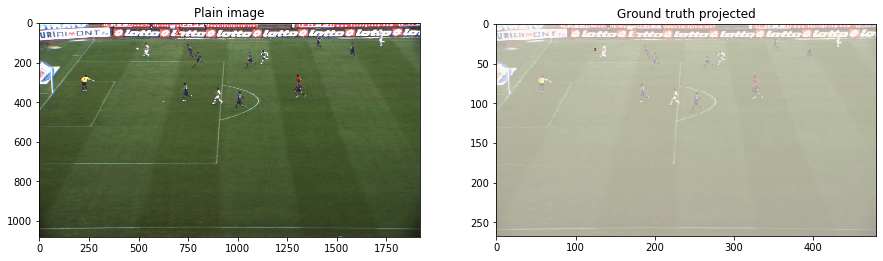

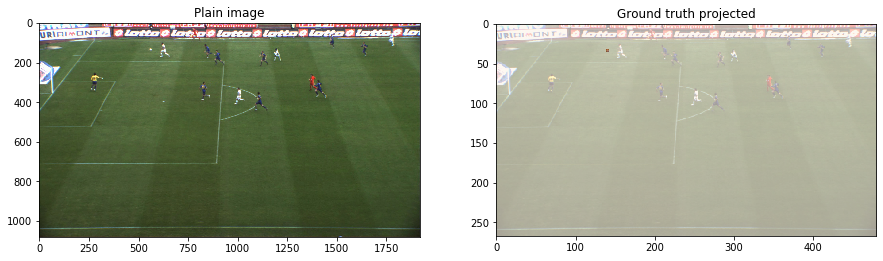

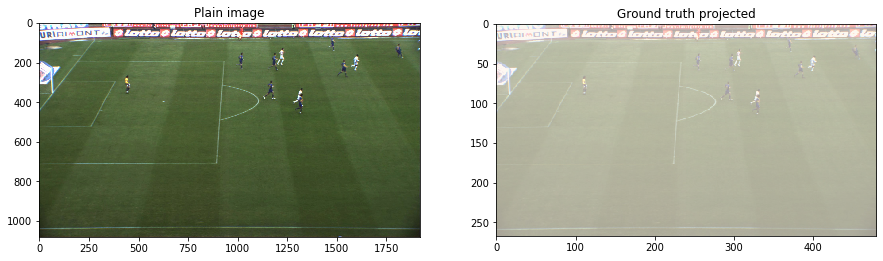

In [22]:
plot_pretrain(toy)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


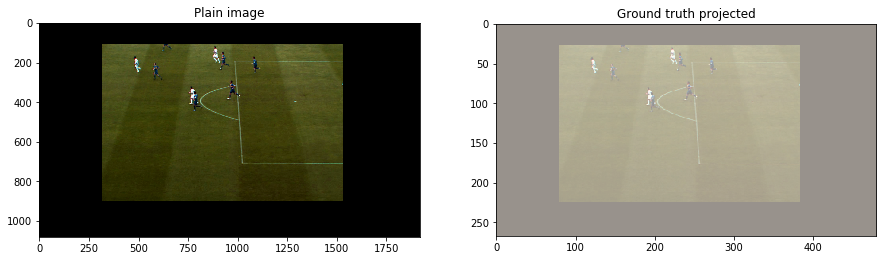

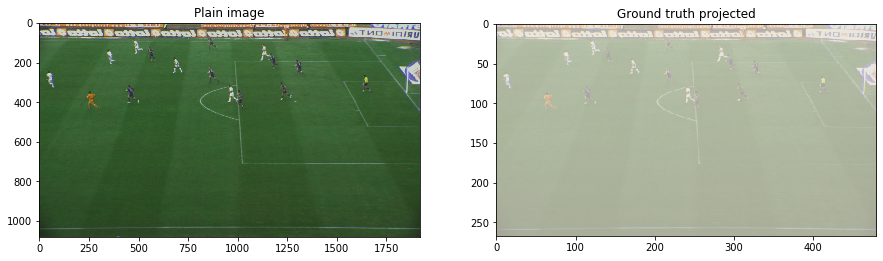

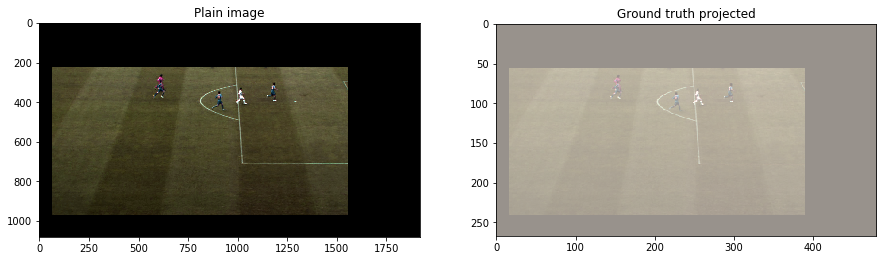

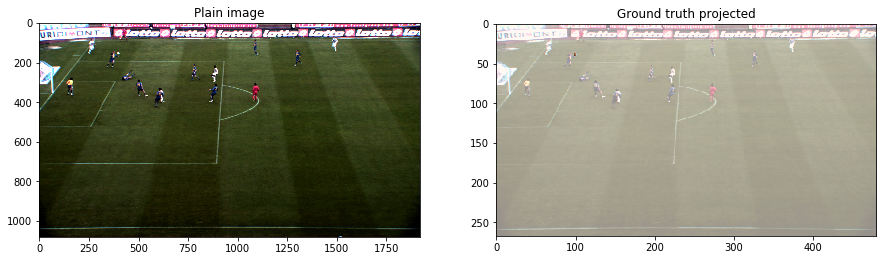

In [23]:
plot_pretrain(toy, augment=True)

### Neural network

#### Architecture

In [10]:
images = layers.Input(shape=(1080, 1920, 3), name='input')
#conv1
conv1_1=layers.Conv2D(filters=8, kernel_size=(7,7), strides=2, 
                      activation='relu', padding='same', name='conv1_1')(images)
conv1_2=layers.Conv2D(filters=8, kernel_size=(3,3), activation='relu',
                      padding='same', name='conv1_2')(conv1_1)
conv1_3_toobig=layers.MaxPool2D(pool_size=(2,2), name='conv1_3_toobig')(conv1_2)
conv1_3=layers.Cropping2D(((1,1),(0,0)), name='conv1_3_cropped')(conv1_3_toobig)
conv1_3_norm=tf.keras.layers.BatchNormalization(name='conv1_3_norm')(conv1_3)

#conv2
conv2_1=layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu',
                      padding='same', name='conv2_1')(conv1_3_norm)
conv2_2=layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu',
                      padding='same', name='conv2_2')(conv2_1)
conv2_3=layers.MaxPool2D(pool_size=(2,2), name='conv2_3')(conv2_2)
conv2_3_norm=tf.keras.layers.BatchNormalization(name='conv2_3_norm')(conv2_3)

#conv3
conv3_1=layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu',
                      padding='same', name='conv3_1')(conv2_3_norm)
conv3_2=layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu',
                      padding='same', name='conv3_2')(conv3_1)
conv3_3=layers.MaxPool2D(pool_size=(2,2), name='conv3_3')(conv3_2)
conv3_3_norm=tf.keras.layers.BatchNormalization(name='conv3_3_norm')(conv3_3)


#upsamples and concatenation

upsamp_2=layers.UpSampling2D((2,2), name='conv2_upsampled')(conv2_3_norm)
upsamp_3=layers.UpSampling2D((4,4), name='conv3_upsampled')(conv3_3_norm)
concat=layers.Concatenate(name='concatenation')([conv1_3_norm,upsamp_2, upsamp_3])

#conv4
conv4_1=layers.Conv2D(filters=56, kernel_size=(3,3), activation='relu',
                      padding='same', name='conv4_1')(concat)

conv4_2=layers.Conv2D(filters=1, kernel_size=(3,3), activation='relu',
                      padding='same', name='conv4_2')(conv4_1)
conv4_3=layers.Reshape(target_shape=(268, 480), name='conv_4_3')(conv4_2)
conv4_3_norm=layers.BatchNormalization(name='conv4_3_norm')(conv4_3)


#softmax
softmax=layers.Softmax(name='softmax')(conv4_3)


net = Model(inputs=[images], outputs=[softmax])
net.summary()


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 1080, 1920,  0                                            
__________________________________________________________________________________________________
conv1_1 (Conv2D)                (None, 540, 960, 8)  1184        input[0][0]                      
__________________________________________________________________________________________________
conv1_2 (Conv2D)                (None, 540, 960, 8)  584         conv1_1[0][0]                    
__________________________________________________________________________________________________
conv1_3_toobig (MaxPooling2D)   (None, 270, 480, 8)  0           conv1_2[0][0]                    
______________________________________________________________________________________________

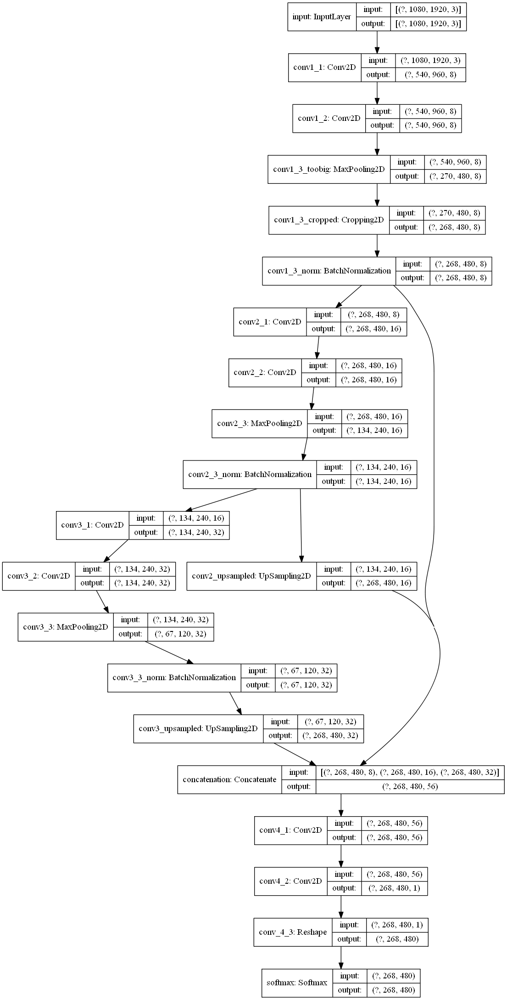

In [11]:
tf.keras.utils.plot_model(net, 'model.png', show_shapes=True, show_layer_names=True)

#### Loss function

$$ \cal L_{B}=-\sum_{(i, j) \in P o s^{B}} \log c_{ij}^{B}-\sum_{(i, j) \in N e g^{B}} \log \left(1-c_{i j}^{B}\right)$$

In [12]:
def my_loss(y_true, y_pred):
    ball_loss=y_true*(-tf.math.log(y_pred)) #the pixel per pixel cross entropy for the ball
    tf.stop_gradient(ball_loss) #to prevents the contribution of its successive inputs to be taken into account,
                                #since the next functions can not be derived and are not needed for the backprop.
    ball_loss=tf.map_fn(lambda x: tf.math.top_k(tf.keras.backend.flatten(x), 9)[0], ball_loss) 
    
    back_loss=(1-y_true)*(-tf.math.log(1-y_pred))
    tf.stop_gradient(back_loss)
    back_loss=tf.map_fn(lambda x: tf.math.top_k(tf.keras.backend.flatten(x), 27)[0], back_loss)
    
    return tf.concat([tf.keras.backend.flatten(ball_loss), tf.keras.backend.flatten(back_loss)], axis=0)

#### Accuracy

For the moment the $\theta$ is set as $0.4$, it will be optimized at the end.
It's important to remember this looking at the plots; it's useful to have a clue of an average accuracy but minimizing the loss is the task of our network.

In [13]:
def ball_detection_accuracy(y_true, y_pred, trash=0.4):
    have_ball=tf.map_fn(lambda x: tf.reduce_sum(x)/9, y_true) #which image contains the ball
    maxi= tf.map_fn(lambda x: tf.reduce_max(x), y_pred) #the point in which the confidence map is higer
    detected_ball=tf.where(maxi>trash, 1., 0) #which image is predicted to have the ball
    maxi_true=tf.map_fn(lambda x: tf.reduce_max(x), tf.where(y_true==1, y_pred, 0)) #the point in which the confidence map is
                                                                                    #higer beteween the points labeled as ball                                                                                   
    detected_right=tf.where(maxi_true==maxi, 1., 0) #the image with the same max among all points and true points
    detected_right=tf.where(maxi_true>trash, detected_right, 0) #the images in which a ball is predicted, and is
                                                                #predicted in the right place
    result=tf.where(have_ball==1, detected_right, 1-detected_ball) #the final accuracy tensor
    return result

## Part 4: Experimental evaluation

This is the function that trains our net. 
Takes as input the net and trains it for a given number of epochs (it's also possible to decrease the learning rate after x epochs). Returns the history of the loss and of the accuracy.

In [96]:
def compile_and_fit(model, train_data, val_data,epochs=2, augment=False,
                   lr_2=False, epochs2=0):
    model.compile(loss=my_loss,
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=[ball_detection_accuracy])
    
    if augment==False:
        train_dataset=train_data.map(preprocess).shuffle(100).batch(4)
    else:
        train_dataset=train_data.map(preprocess).map(augmenter, num_parallel_calls=AUTOTUNE).shuffle(100).batch(4)
    val_dataset=val_data.map(preprocess).batch(4)

    history = model.fit(train_dataset,validation_data=val_dataset, epochs=epochs)
    h1=history.history
    if lr_2==True:
        model.compile(loss=my_loss,
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
            metrics=[ball_detection_accuracy])
        history2= model.fit(train_dataset,validation_data=val_dataset, epochs=epochs2)
        h2=history2.history
        for k in h1.keys():
            h1[k]=h1[k]+h2[k]
    return h1

Set up validation and test datasets:

In [13]:
val_data, test_data= utilities.get_data(cams=[5], val_split=0.5)

### Data augmentation analyisis 

Experiment with an half of the data to take a look at the difference between training with and without augmented data.

#### Network trainings

In [105]:
train_data=utilities.get_data(cams=[1, 3,4], reduction=0.5)

In [32]:
net_no_aug=tf.keras.models.clone_model(net)
history=compile_and_fit(net_no_aug, train_data, val_data, epochs=16, lr_2=True, epochs2=8)

Train for 985 steps, validate for 337 steps
Epoch 1/16
985/985 [==============================] - 639s 649ms/step - loss: 0.2762 - ball_detection_accuracy: 0.7406 - val_loss: 0.1118 - val_ball_detection_accuracy: 0.9288
Epoch 2/16
985/985 [==============================] - 637s 647ms/step - loss: 0.2271 - ball_detection_accuracy: 0.7904 - val_loss: 0.0957 - val_ball_detection_accuracy: 0.9466
Epoch 3/16
985/985 [==============================] - 637s 647ms/step - loss: 0.2072 - ball_detection_accuracy: 0.8150 - val_loss: 0.0930 - val_ball_detection_accuracy: 0.9132
Epoch 4/16
985/985 [==============================] - 643s 653ms/step - loss: 0.1981 - ball_detection_accuracy: 0.8203 - val_loss: 0.1127 - val_ball_detection_accuracy: 0.9043
Epoch 5/16
985/985 [==============================] - 644s 654ms/step - loss: 0.1916 - ball_detection_accuracy: 0.8287 - val_loss: 0.0856 - val_ball_detection_accuracy: 0.9169
Epoch 6/16
985/985 [==============================] - 644s 654ms/step - loss

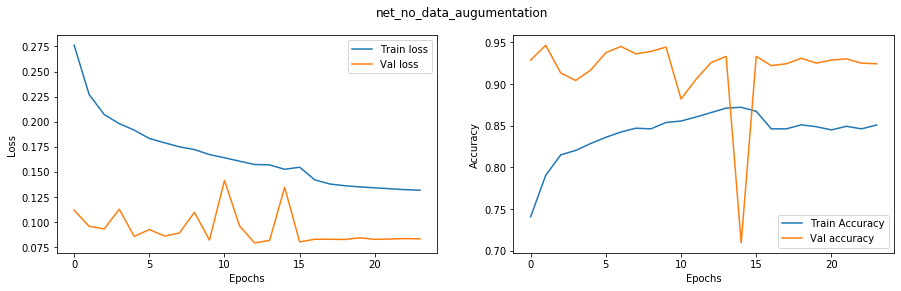

In [34]:
plot_history(history, 'net_no_data_augumentation')
net_no_daug.save('trained_models/nodag.h5')

In [106]:
net_aug=tf.keras.models.clone_model(net)
history=compile_and_fit(net_aug, train_data, val_data, epochs=16, lr_2=True, epochs2=8, augment=True)

Train for 985 steps, validate for 337 steps
Epoch 1/16
985/985 [==============================] - 651s 661ms/step - loss: 0.2722 - ball_detection_accuracy: 0.7520 - val_loss: 0.1192 - val_ball_detection_accuracy: 0.8887
Epoch 2/16
985/985 [==============================] - 651s 661ms/step - loss: 0.2223 - ball_detection_accuracy: 0.8081 - val_loss: 0.0936 - val_ball_detection_accuracy: 0.9355
Epoch 3/16
985/985 [==============================] - 650s 660ms/step - loss: 0.2041 - ball_detection_accuracy: 0.8317 - val_loss: 0.0985 - val_ball_detection_accuracy: 0.9280
Epoch 4/16
985/985 [==============================] - 651s 661ms/step - loss: 0.1976 - ball_detection_accuracy: 0.8388 - val_loss: 0.0973 - val_ball_detection_accuracy: 0.9421
Epoch 5/16
985/985 [==============================] - 652s 662ms/step - loss: 0.1880 - ball_detection_accuracy: 0.8447 - val_loss: 0.0939 - val_ball_detection_accuracy: 0.9496
Epoch 6/16
985/985 [==============================] - 653s 663ms/step - loss

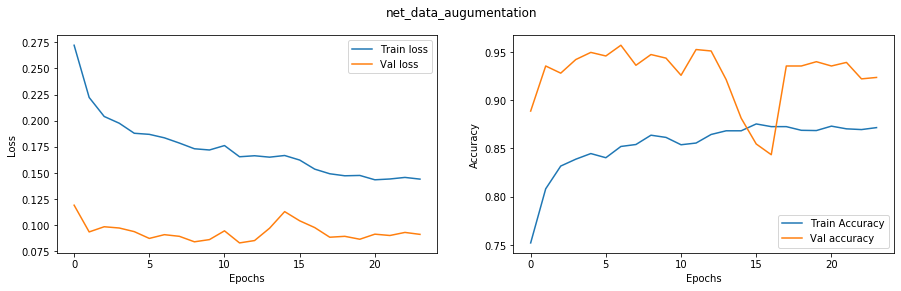

In [107]:
plot_history(history, 'net_data_augumentation')
net_aug.save('trained_models/aug.h5')

##### Comments

Seems that, at least in this experiment, data augmentation has not a strong impact.

The validation loss is lower, and this could appear strange. The reason is that the camera used for validation and test, being one of the four cameras at the edge of the pitch field, has a lower number of images with ball rateo, and so it's easier to predict. We will explore this further in the next paragrahps.



### Running the last model

In the end I decided to run the train only for ten epochs ($5$ with $0.001$ learning rate and $5$ with $0.0001$ learning rate).
I also tried to run it for more epochs, but it did not lead to performance improovments.

In [97]:
train_data=utilities.get_data(cams=[1, 3,4])

In [98]:
net_last=tf.keras.models.clone_model(net)
history=compile_and_fit(net_last, train_data, val_data, epochs=5, lr_2=True, epochs2=5, augment=True)

Train for 1970 steps, validate for 337 steps
Epoch 1/5
1970/1970 [==============================] - 1236s 627ms/step - loss: 0.2466 - ball_detection_accuracy: 0.7720 - val_loss: 0.1396 - val_ball_detection_accuracy: 0.9043
Epoch 2/5
1970/1970 [==============================] - 1243s 631ms/step - loss: 0.2054 - ball_detection_accuracy: 0.8159 - val_loss: 0.1084 - val_ball_detection_accuracy: 0.9332
Epoch 3/5
1970/1970 [==============================] - 1238s 628ms/step - loss: 0.1897 - ball_detection_accuracy: 0.8391 - val_loss: 0.1268 - val_ball_detection_accuracy: 0.9191
Epoch 4/5
1970/1970 [==============================] - 1225s 622ms/step - loss: 0.1824 - ball_detection_accuracy: 0.8379 - val_loss: 0.0830 - val_ball_detection_accuracy: 0.9377
Epoch 5/5
1970/1970 [==============================] - 1230s 624ms/step - loss: 0.1793 - ball_detection_accuracy: 0.8416 - val_loss: 0.0933 - val_ball_detection_accuracy: 0.9392
Train for 1970 steps, validate for 337 steps
Epoch 1/5
1970/1970 

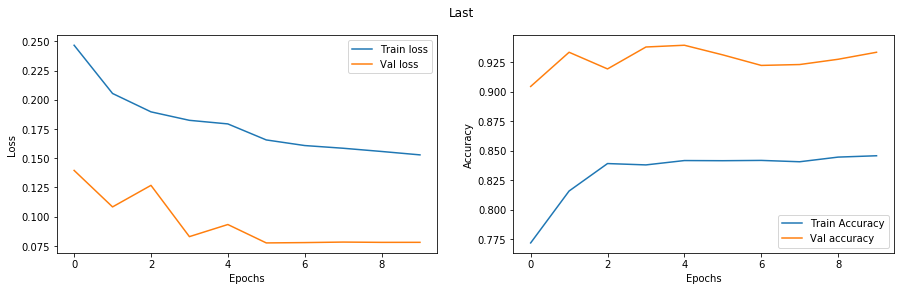

In [102]:
plot_history(history, 'Last')
net_last.save('trained_models/last.h5')

Store the final weights:

In [ ]:
#net.save('trained_models/last.h5')

### Choosing the best trashold

The trashold $\theta$ is chosen taking the one that maximizes validation accuracy.

In [10]:
net= tf.keras.models.load_model('trained_models/last.h5', compile=False)

In [12]:
def evaluate(model,test_data, trashold):
    test_dataset=test_data.map(preprocess).batch(4)
    def ball_detection_accuracy_ev(y_true, y_pred):
        return ball_detection_accuracy(y_true, y_pred,trash=trashold)
    model.compile(loss=my_loss, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), metrics=[ball_detection_accuracy_ev])
    return model.evaluate(test_dataset)

337/337 [==============================] - 71s 210ms/step - loss: 0.0781 - ball_detection_accuracy_ev: 0.8806


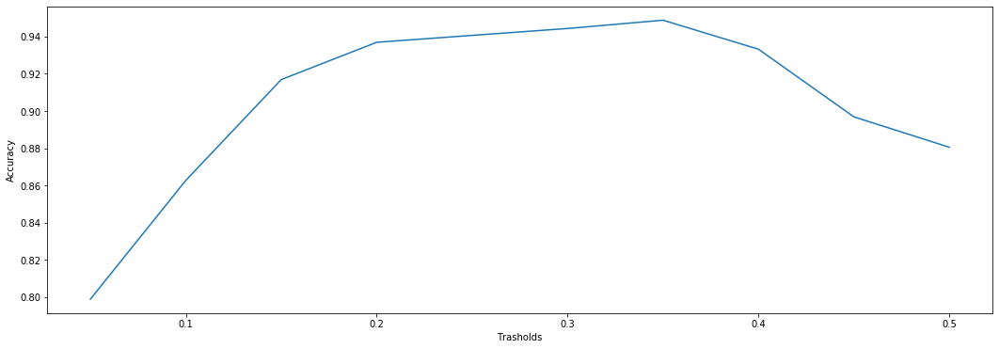

<Figure size 432x288 with 0 Axes>

In [109]:
accs=[]
trasholds=[0.05, 0.1, 0.15, 0.2, 0.25,0.3, 0.35,0.4, 0.45, 0.5]

for trash in trasholds:
    res_t=evaluate(net, val_data, trash)
    accs.append(res_t[1])

plt.figure(figsize=(18,6))
plt.plot(trasholds, accs)
plt.xlabel('Trasholds')
plt.ylabel('Accuracy')
plt.savefig('plots/theta.png')

The best $\theta$ according to the validation test is $0.35$

### Is it really the best trashold?
###### Exploring our errors

Here I studied the accuracy evaluated on sub set of data containing only images with ball, or only images without ball.

In [110]:
val_ball, test_ball=utilities.get_data(cams=[5],no_ball='no', val_split=0.5)
val_no_ball, test_no_ball=utilities.get_data(cams=[5], no_ball='only', val_split=0.5)

In [111]:
t=[]
t_b=[]
t_nb=[]

trasholds=[0.05, 0.1, 0.15, 0.2, 0.25,0.3, 0.35,0.4, 0.45]

for trash in trasholds:
    print(trash)
    res_t=evaluate(net,val_data, trash)
    t.append(res_t[1])
    res_tb=evaluate(net,val_ball, trash)
    t_b.append(res_tb[1])
    res_tnb=evaluate(net,val_no_ball, trash)
    t_nb.append(res_tnb[1])    

0.05
296/296 [==============================] - 62s 211ms/step - loss: 0.0121 - ball_detection_accuracy_ev: 0.7872
0.1
296/296 [==============================] - 63s 211ms/step - loss: 0.0121 - ball_detection_accuracy_ev: 0.8598
0.15
296/296 [==============================] - 63s 211ms/step - loss: 0.0121 - ball_detection_accuracy_ev: 0.9375
0.2
296/296 [==============================] - 62s 210ms/step - loss: 0.0121 - ball_detection_accuracy_ev: 0.9628
0.25
296/296 [==============================] - 62s 211ms/step - loss: 0.0121 - ball_detection_accuracy_ev: 0.9688
0.3
296/296 [==============================] - 63s 211ms/step - loss: 0.0121 - ball_detection_accuracy_ev: 0.9738
0.35
296/296 [==============================] - 63s 212ms/step - loss: 0.0121 - ball_detection_accuracy_ev: 0.9823
0.4
296/296 [==============================] - 63s 211ms/step - loss: 0.0121 - ball_detection_accuracy_ev: 0.9899
0.45
296/296 [==============================] - 63s 211ms/step - loss: 0.0121 - ball

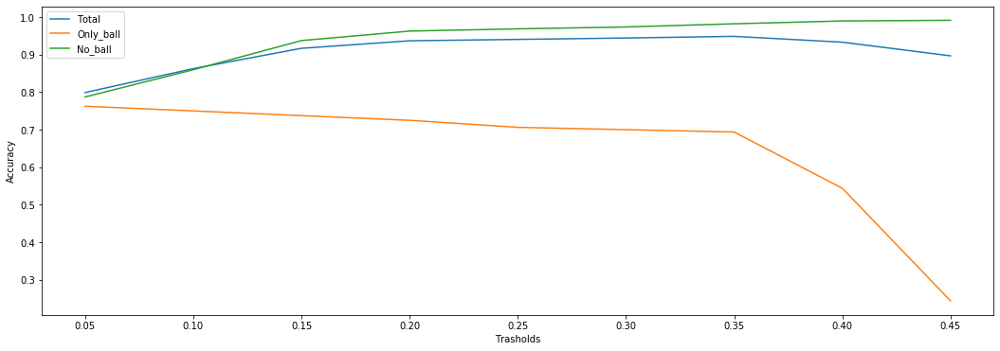

In [112]:
plt.figure(figsize=(18,6))
plt.plot(trasholds, t)
plt.plot(trasholds, t_b)
plt.plot(trasholds, t_nb)
plt.legend(['Total', 'Only_ball', 'No_ball'])
plt.xlabel('Trasholds')
plt.ylabel('Accuracy')
plt.savefig('plots/theta_2.png')

The first thing that is evident is that the accuracy on the whole validation test is strongly influenced by the accuracy on the images without the ball, because they are a lot more (around $85\%$). It was important to have this visual check because training with smaller sub set I sometimes experienced best trashold that heavly penalized the accuracy of images with the ball to get smaller improovments on the whole dataset.

This is not the case because at $\theta = 0.35$ the accuracy on the ball images is still quite good, and then it starts to drop very fast.

### Evaluate

Now it's time to see how our net performs on the test:

In [15]:
evaluate(net, test_data, 0.35)

337/337 [==============================] - 74s 220ms/step - loss: 0.0830 - ball_detection_accuracy_ev: 0.9473


[0.08301148204359528, 0.9473294]

We observe an accuracy of $0.947$.

### Visualizing the results

To test on the toy, load the final net:

In [18]:
net= tf.keras.models.load_model('trained_models/last.h5', compile=False)

#### Results and ground truth 

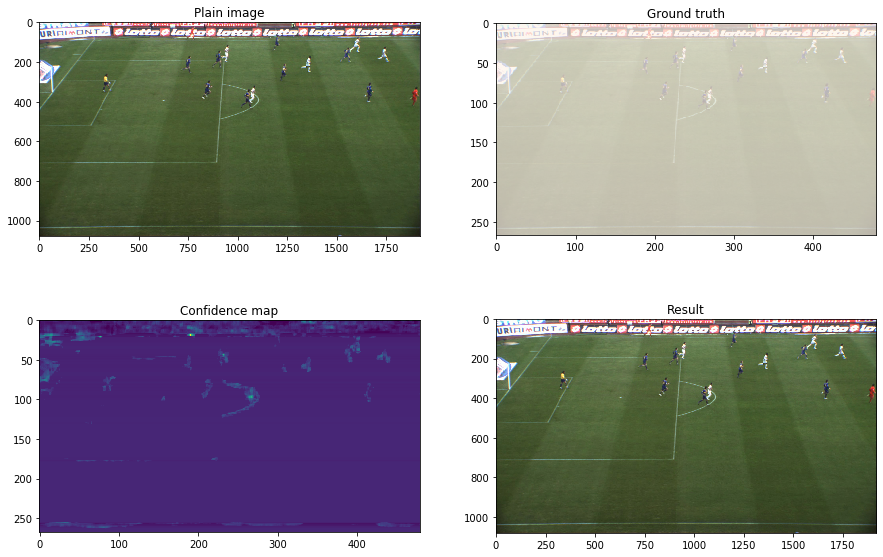

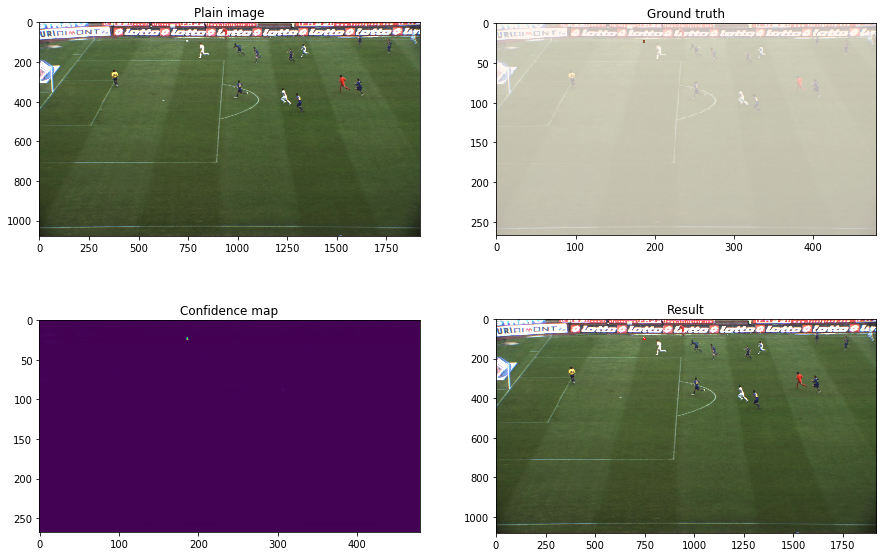

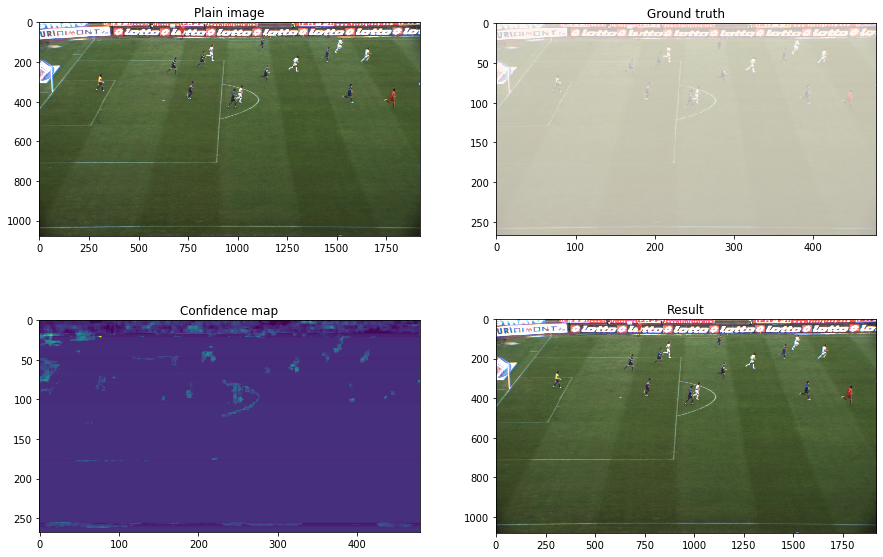

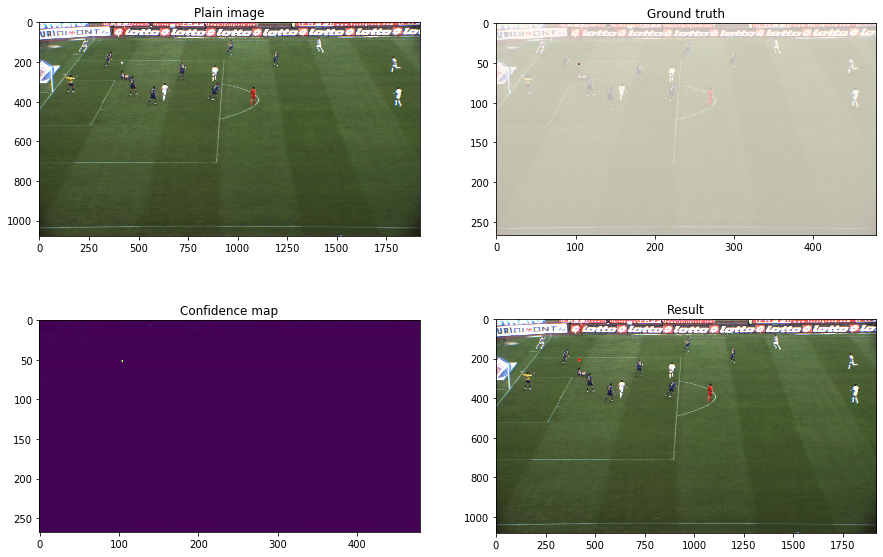

In [24]:
plot_post(net, data=toy, trash=0.35)

#### A zoom on the errors

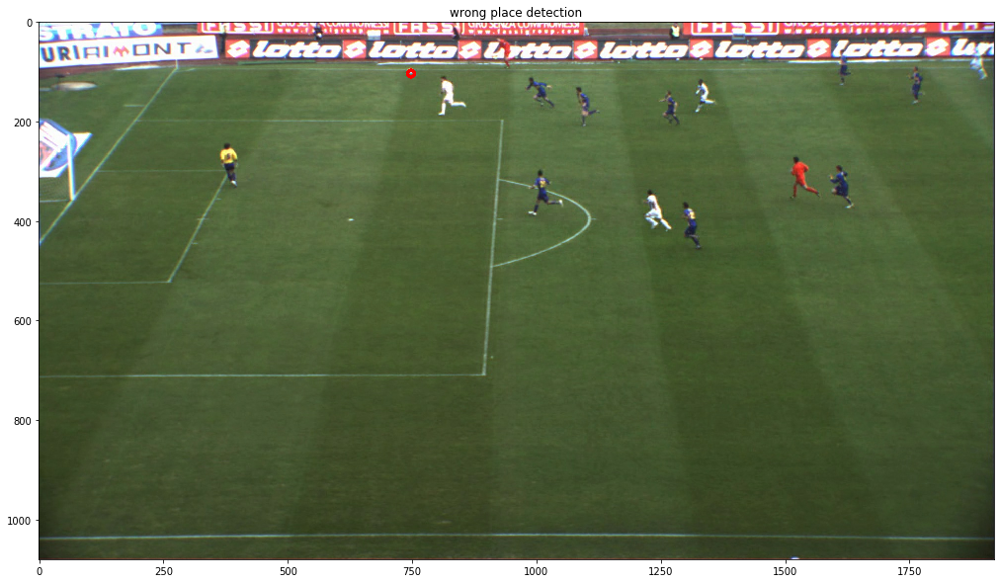

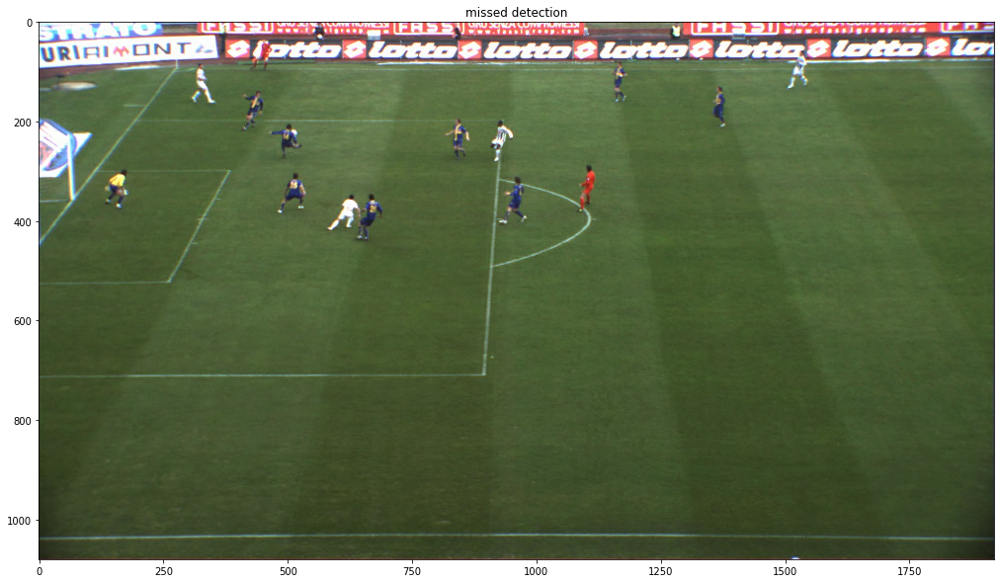

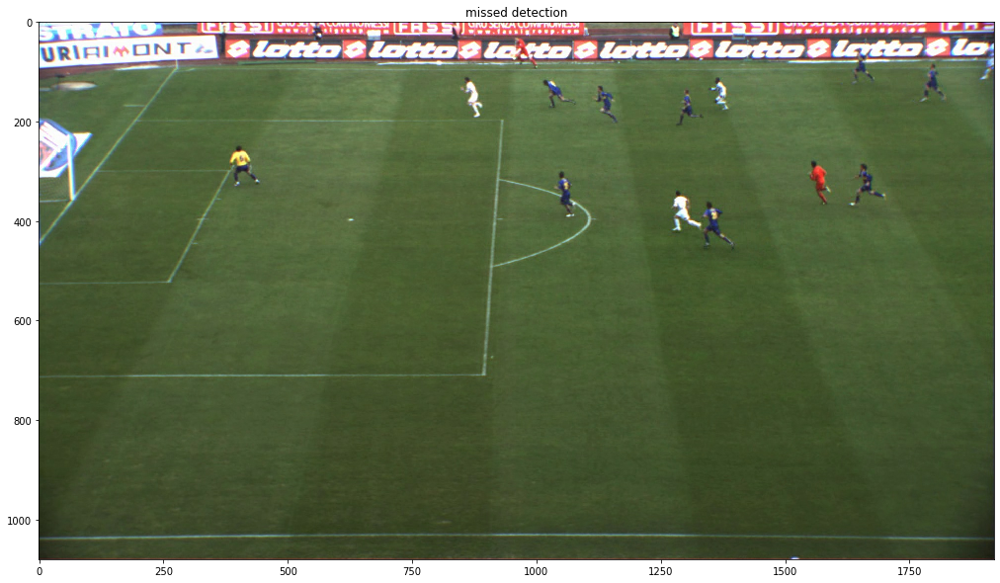

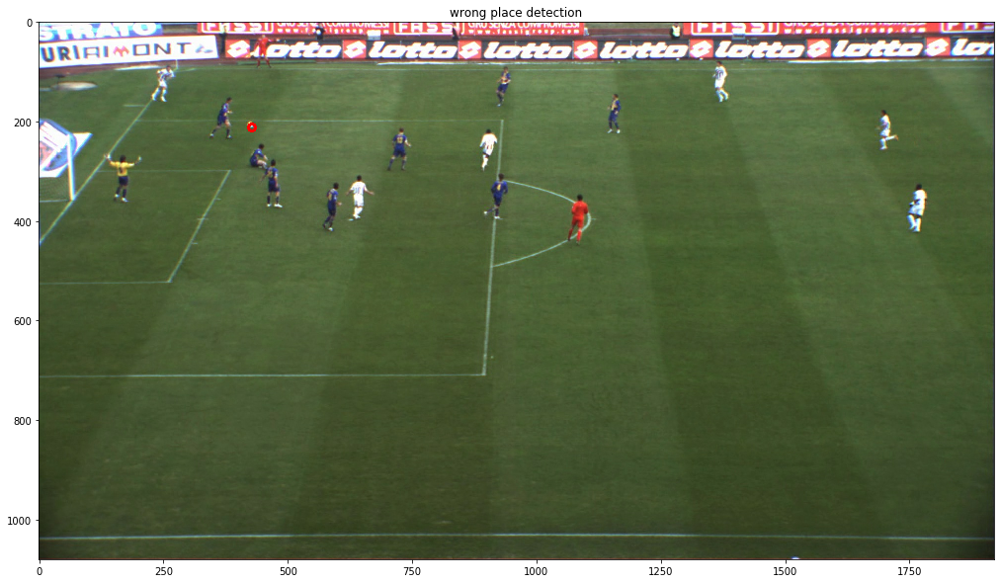

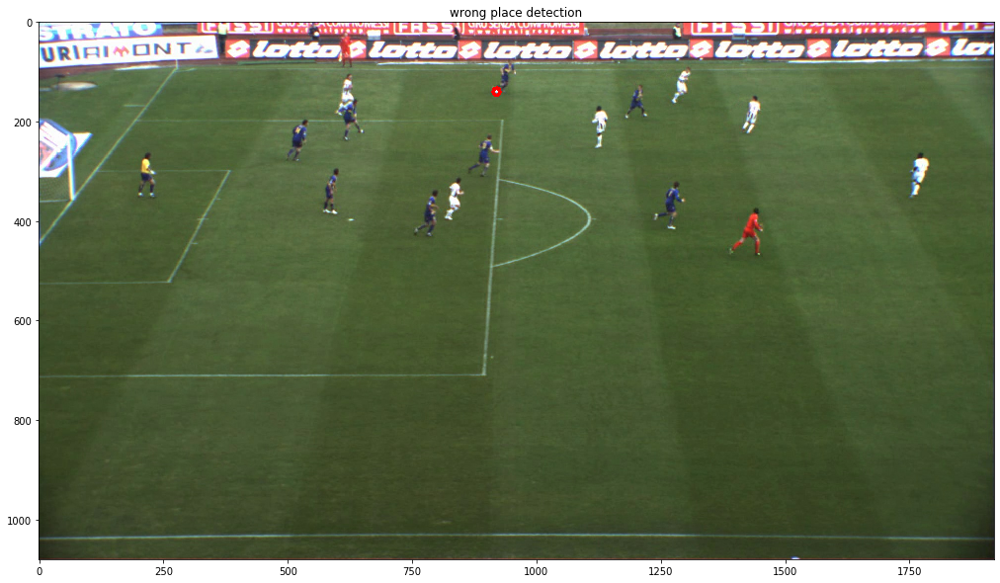

...

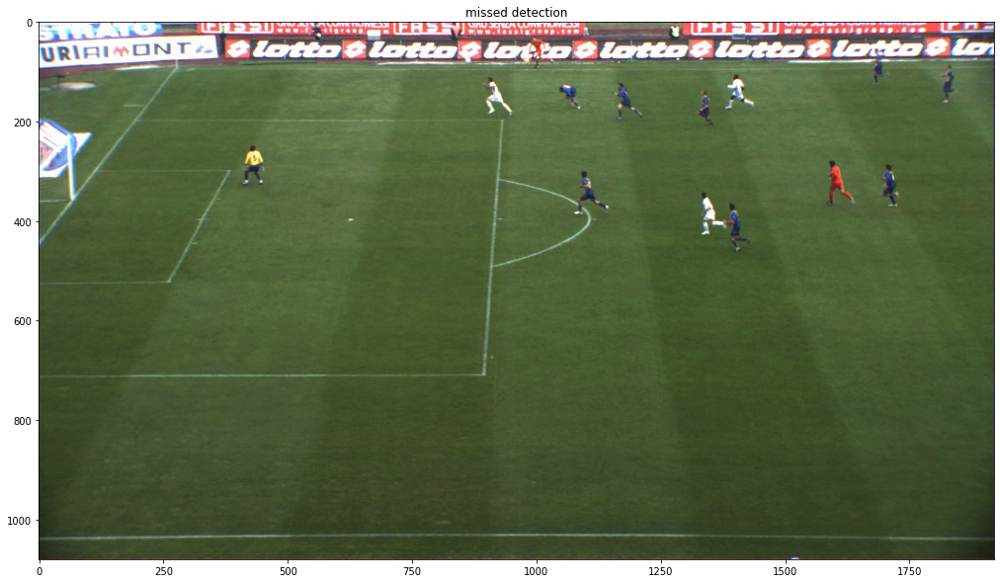

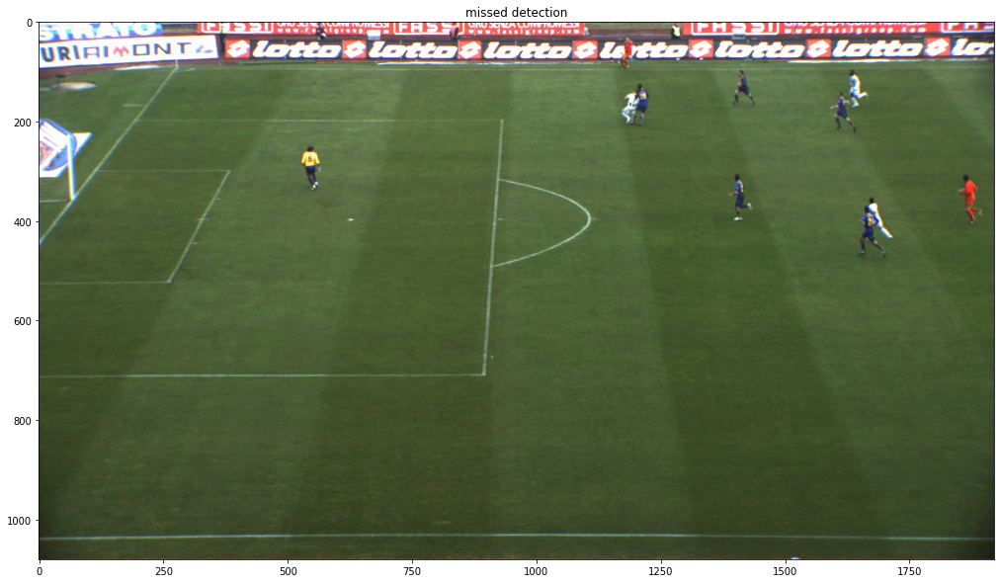

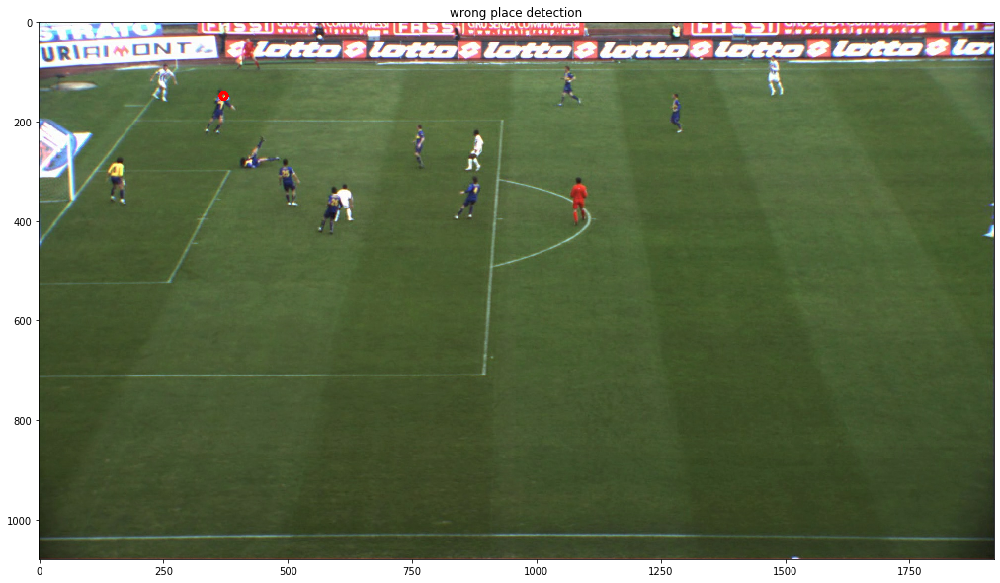

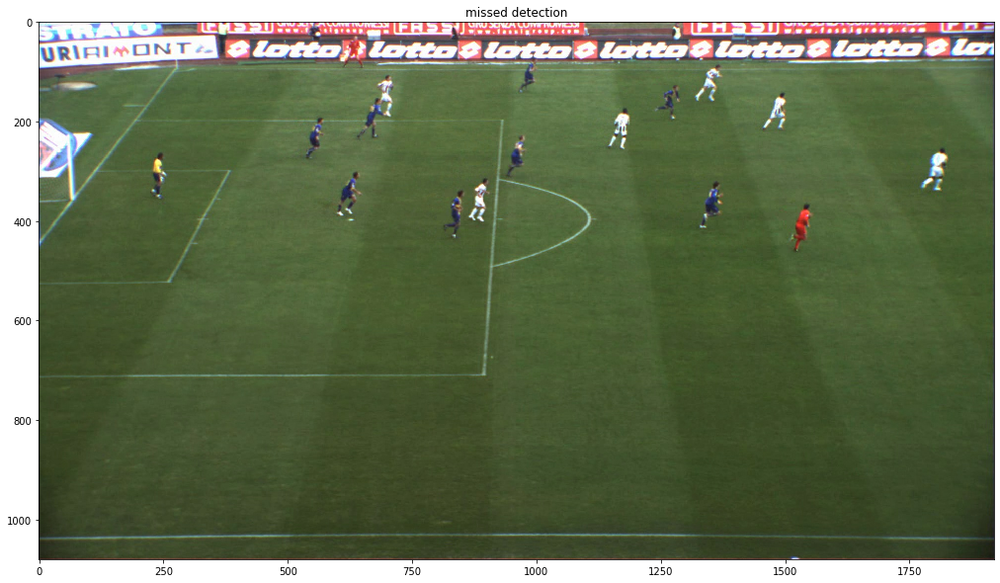

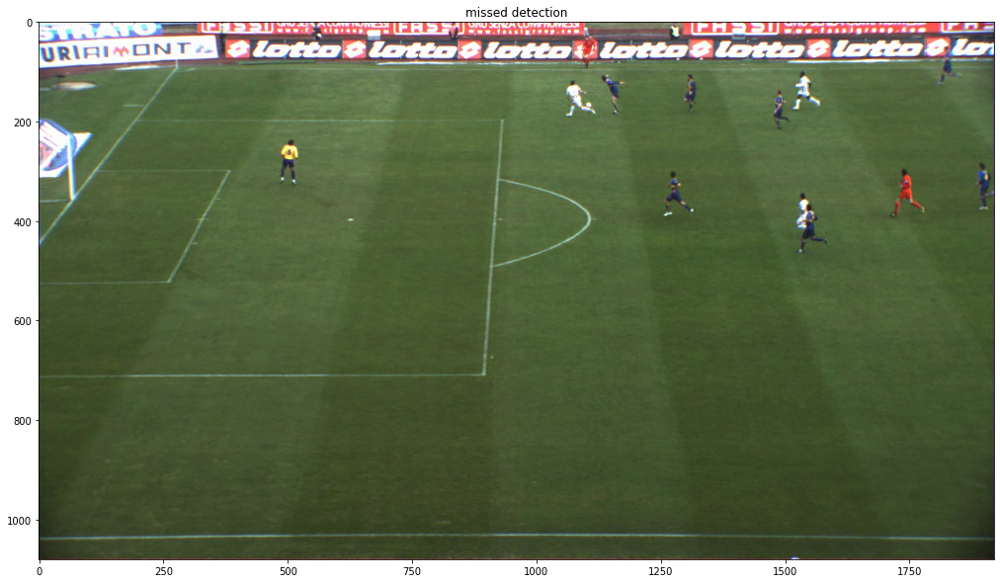

In [25]:
show_errors(net,toy, take=30, trash=0.35)

We see that we have some errors that are just wrong for a bunch of pixel of distance from the labeled one.
A real problem is instead the fact that is very difficult sometimes to distinguish the ball from the advertising poster or from white socks.

#### Creating the final video 

Here we create the video annotated with all the frames from camera 5. 

In [11]:
video_data=utilities.get_data(cams=[5])

In [12]:
def prepro_onlypath(path, label):
  
    image = tf.io.read_file(path)
    image = tf.io.decode_image(image, channels=3) 
    image = tf.image.resize_with_crop_or_pad(image, 1080, 1920) 
    image = tf.cast(image, tf.float32) / 255.0 
 
    return image, path

In [13]:
for x, y in video_data.map(prepro_onlypath).batch(1): 
    prediction=net.predict(x)
    for i in range(0,1):    
        im=(x[i].numpy())
        mappa=prediction[i]
        if tf.math.reduce_max(mappa)> 0.35:
            cent=tf.unravel_index(tf.math.argmax(tf.reshape(mappa,[-1])), [268,480])
            cv2.circle(im, (cent[1]*4, cent[0]*4), 7, (1,0,0), 5)
        new_path="newframes/"+str(y[i].numpy()).replace("'", "").split('/')[4]
        plt.imsave(new_path, im)

In [21]:
imgs=[]
for i in range(298, 3000):
    imgs.append('newframes\\'+str(i)+'.jpg')
    
img_array = []
for filename in imgs:
    img = cv2.imread(filename)
    img_array.append(img)
 
 
out = cv2.VideoWriter('video_all.avi',cv2.VideoWriter_fourcc(*'DIVX'), 25, (1920,1080))
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()

A gif generated from the video:

![](gif_mini.gif)